## Scope

The purpose of this notebook is to try different models with different settings in order to reconstruct a pixelated image.

### Necessary Imports

In [1]:
import numpy as np
from PIL import Image
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.random_projection import GaussianRandomProjection
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.kernel_approximation import RBFSampler
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
import pandas as pd

### Loading the image

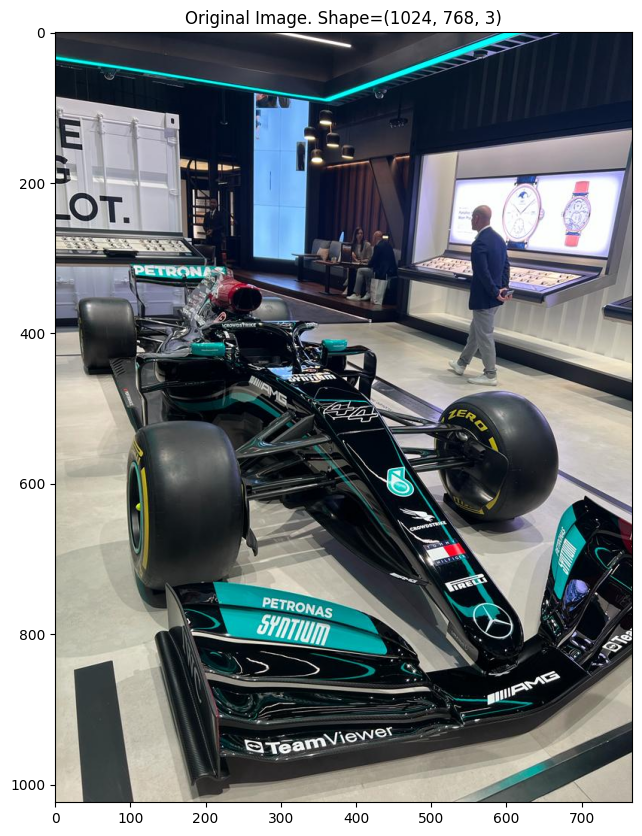

In [2]:
IMAGE_PATH = './f1_car_rgb.jpg'

image = np.asarray(Image.open(IMAGE_PATH))

plt.figure(figsize=[20, 10])
plt.imshow(image)
plt.title(f"Original Image. Shape={image.shape}")
plt.show()

image = image.mean(axis=2)

The following formulas are used to convert the image to grayscale and to create the squares/rectangles that pixelate the image.

In [3]:
def less_equal_than(pixel_value):
    return pixel_value/12.92

def greater_than(pixel_value):
    tmp=(pixel_value+0.055)/1.055
    tmp=tmp**2.4
    return tmp

def get_y_linear(r_linear,g_linear,b_linear,red_coef,green_coef,blue_coef):
    y_linear=r_linear*red_coef+g_linear*green_coef+b_linear*blue_coef
    return y_linear

def normalize_output(y):
    y=(y-np.min(y))/(np.max(y)-np.min(y))
    return y

def apply_formulas(array: np.ndarray):
    array=np.divide(array,255)
    array=np.where(array<=0.04045,less_equal_than(array),greater_than(array))

    r_linear=array[:,:,0]
    g_linear=array[:,:,1]
    b_linear=array[:,:,2]
    red_coef,green_coef,blue_coef=0.2126,0.7152,0.0722

    y_linear=get_y_linear(r_linear,g_linear,b_linear,red_coef,green_coef,blue_coef)
    y=np.where(y_linear<=0.0031308,y_linear*12.92,1.055*np.power(y_linear,1/2.4)-0.055)
    y=normalize_output(y)
    return y

def to_grayscale(pil_image: np.ndarray) -> np.ndarray:
    # 2D image - grayscale
    if len(pil_image.shape)==2:
        array_returned=np.copy(pil_image)

        height=pil_image.shape[0]
        width=pil_image.shape[1]
        array_returned=array_returned.reshape(1,height,width) # (1,H,W)
        return array_returned

    # 3D image - RGB
    elif len(pil_image.shape)==3:
        if pil_image.shape[2]!=3:
            raise ValueError("The 3rd dimension of RGB image is not 3. The image cannot be processed.")
        height=pil_image.shape[0]
        width=pil_image.shape[1]

        array_modified=np.copy(pil_image)
        array_modified=apply_formulas(array_modified)
        output_rgb_to_grayscale=array_modified.reshape(1,height,width)

        if np.issubdtype(pil_image.dtype,np.integer):
            output_rgb_to_grayscale=np.round(output_rgb_to_grayscale*255)
            output_rgb_to_grayscale=output_rgb_to_grayscale.astype(pil_image.dtype)
        else:
            output_rgb_to_grayscale = (output_rgb_to_grayscale * 255).astype(pil_image.dtype)

        return output_rgb_to_grayscale

    else:
        raise ValueError("The shape of the image does not correspond to neither RGB nor grayscale images.")

In [4]:
def change_pixels(i,j,f_pixelated_image,f_known_array,size_i,size_j):
    values = f_pixelated_image[i:i + size_i, j:j + size_j]
    # if values.shape[0] != 0 and values.shape[1] != 0:
    if len(values) != 0:
        mean = np.mean(values)
        f_pixelated_image[i:i + size_i, j:j + size_j] = mean
        f_known_array[i:i + size_i, j:j + size_j] = False
    return f_pixelated_image,f_known_array

def prepare_image(image: np.ndarray,
                  x: int,
                  y: int,
                  width: int,
                  height: int,
                  size: int)-> tuple[np.ndarray,np.ndarray,np.ndarray]:
    original_height=image.shape[1]
    original_width=image.shape[2]

    pixelated_image=np.copy(image).reshape(original_height,original_width)
    known_array=np.ones_like(image).reshape(original_height,original_width)
    target_array=np.copy(image).reshape(original_height,original_width)

    i=y
    input_size=size
    while i<=y+height:
        j=x
        while j<=x+width:
            if i+size>y+height and j+size>x+width:
                size_i=y+height-i
                size_j=x+width-j
                pixelated_image,known_array=change_pixels(i,j,pixelated_image,known_array,size_i,size_j)
            elif i+size>y+height:
                size_i=y+height-i
                pixelated_image, known_array = change_pixels(i, j, pixelated_image, known_array, size_i, size)
            elif j+size>x+width:
                size_j=x+width-j
                pixelated_image, known_array = change_pixels(i, j, pixelated_image, known_array, size, size_j)
            else:
                pixelated_image, known_array = change_pixels(i, j, pixelated_image, known_array, size, size)

            j+=input_size
        i+=input_size

    pixelated_image=pixelated_image.reshape(1,original_height,original_width)
    known_array=known_array.reshape(1,original_height,original_width)
    target_array=target_array[y:y+height,x:x+width]

    return pixelated_image,known_array,target_array


image_rgb = Image.open(IMAGE_PATH)
individual_array = np.array(image_rgb)
array_grayscale_image = to_grayscale(individual_array)
#pixelated_image,known_array,target_array=prepare_image(array_grayscale_image, 100, 40, 50, 60, 10)

pixelated_image,known_array,target_array=prepare_image(array_grayscale_image, 500, 600, 200, 400, 30)


pil_pix_image = Image.fromarray(pixelated_image.squeeze(0))
pil_target_array = Image.fromarray(target_array)

Showing the image, but this time, in grayscale and pixelated

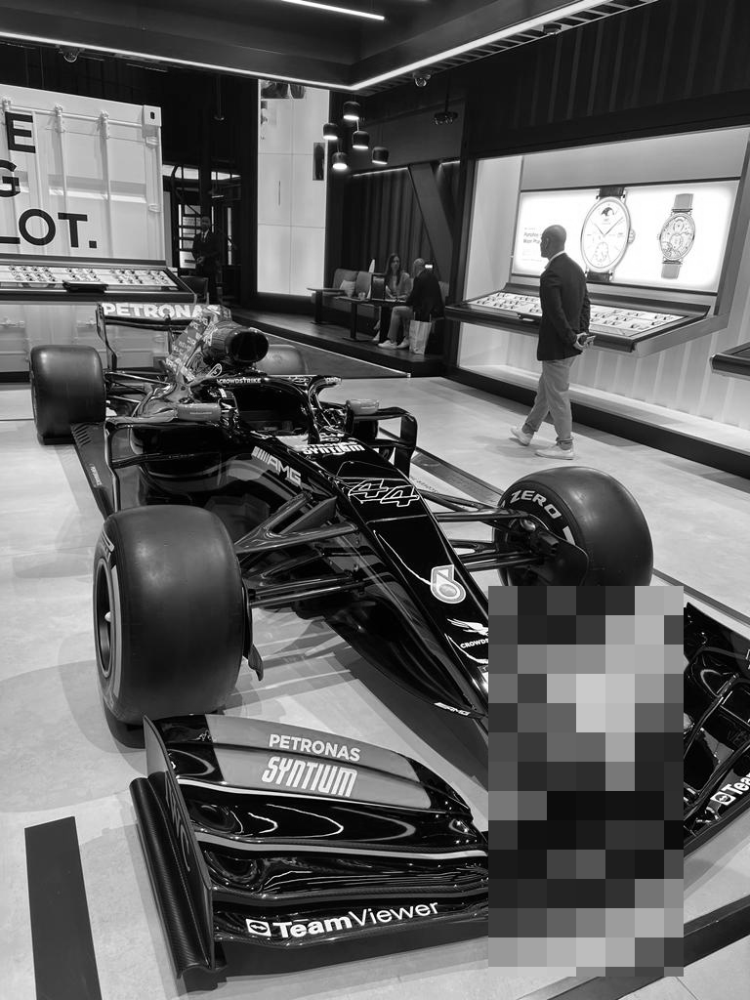

In [5]:
pil_pix_image

Showing the section from the original image (in grayscale) that has just been pixelated.

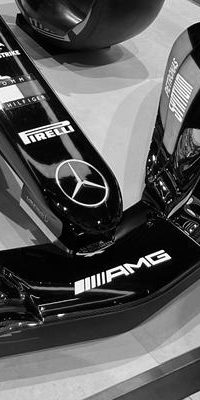

In [6]:
pil_target_array

Train method for the regression models

In [7]:
def train_model(regressor, pixelated_image, known_array, image, train_size=0.02):
    height, width = image.shape
    flat_image = image.reshape(-1)
    xs = np.arange(len(flat_image)) % width
    ys = np.arange(len(flat_image)) // width
    data = np.array([xs, ys]).T
    target = flat_image
    trainX, testX, trainY, testY = train_test_split(data, target, train_size=train_size, random_state=42)
    mean = trainY.mean()
    regressor.fit(trainX, trainY - mean)
    flat_picture = regressor.predict(data) + mean

    pixelated_image = pixelated_image.squeeze(0)
    final_image = np.copy(pixelated_image)
    known_array = known_array.squeeze(0)

    final_image[known_array==0] = flat_picture

    target_flat_metrics = target_array.copy().flatten()
    model_result_flat_metric = flat_picture.copy().flatten()

    mse = mean_squared_error(target_flat_metrics,model_result_flat_metric)

    fig, axs = plt.subplots(2, 2, figsize=[20, 10])

    axs[0, 0].imshow(pixelated_image.squeeze(), cmap='gray')
    axs[0, 0].set_title('Pixelated Image')

    axs[0, 1].imshow(target_array.squeeze(), cmap='gray')
    axs[0, 1].set_title('Target Image')

    axs[1, 0].imshow(flat_picture.reshape(height, width), cmap='gray')
    axs[1, 0].set_title('Model Result')

    axs[1, 1].imshow(final_image.squeeze(), cmap='gray')
    axs[1, 1].set_title('Final Image')

    plt.tight_layout()
    fig.suptitle("Image Stages")
    plt.show()

    return mse

Defining Mean Squared Error (MSE) variables to keep track of the performance of each model. <br/>
Mean Squared Error is defined as follows: $MSE=\frac{1}{N}\sum_{i=1}^N\big(y_i-\hat{y_i}\big)^2$ where
- $N$ is the number of samples from the dataset
- $\hat{y_i}$ is the actual (real value) for the $i^{th}$ sample
- $y_i$ is the predicted value for the $i^{th}$ sample

In [8]:
mseLinearRegression = 0
mseDecisionTreesDepth10 = 0
mseDecisionTreesDepth20 = 0
mseDeicionTreesLeaf40 = 0
mseDecisionTreesLeaf5 = 0
mseDecisionTreesDepthLeaf = 0
mseRandomForest = 0
mseKNN2uniform = 0
mseKNN5distance = 0
mseKNN25distance = 0
mseKNN2metric = 0
mseAdaBoost = 0
mseBagging = 0

### Linear regression model

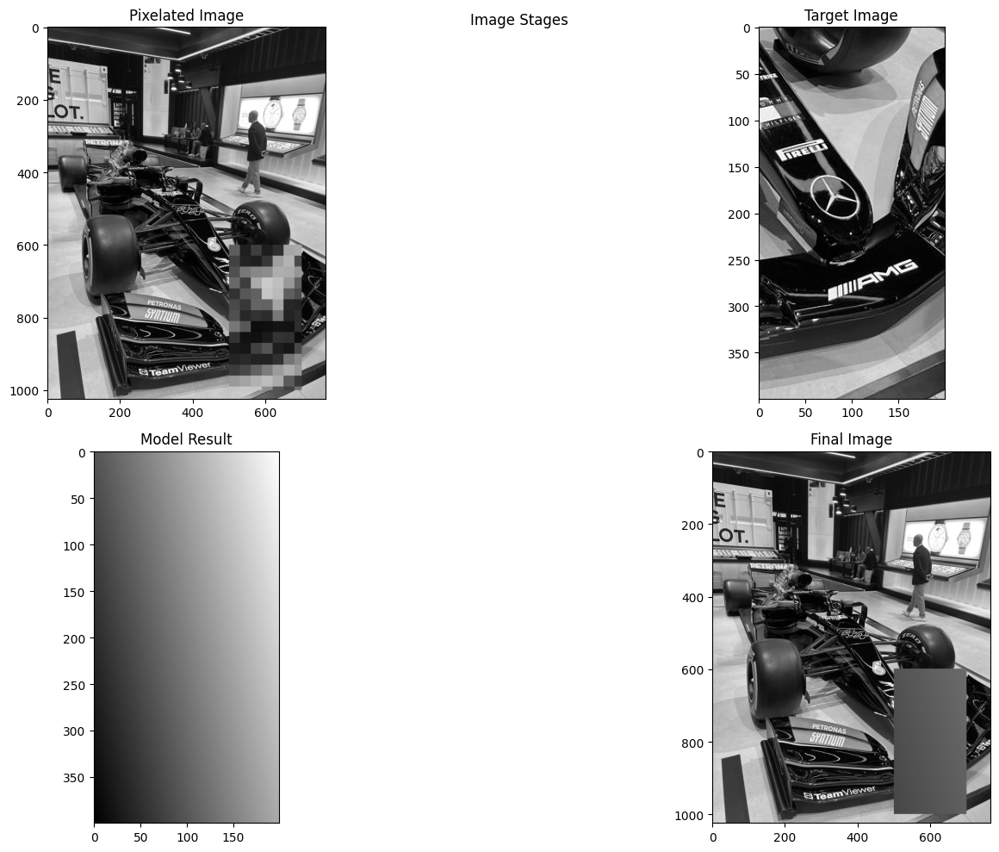


MSE value = 5676.2467


In [9]:
mseLinearRegression = train_model(
    regressor = LinearRegression(),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)

print(f"\nMSE value = {round(mseLinearRegression,4)}")

### Decision Trees model limited by depth 10

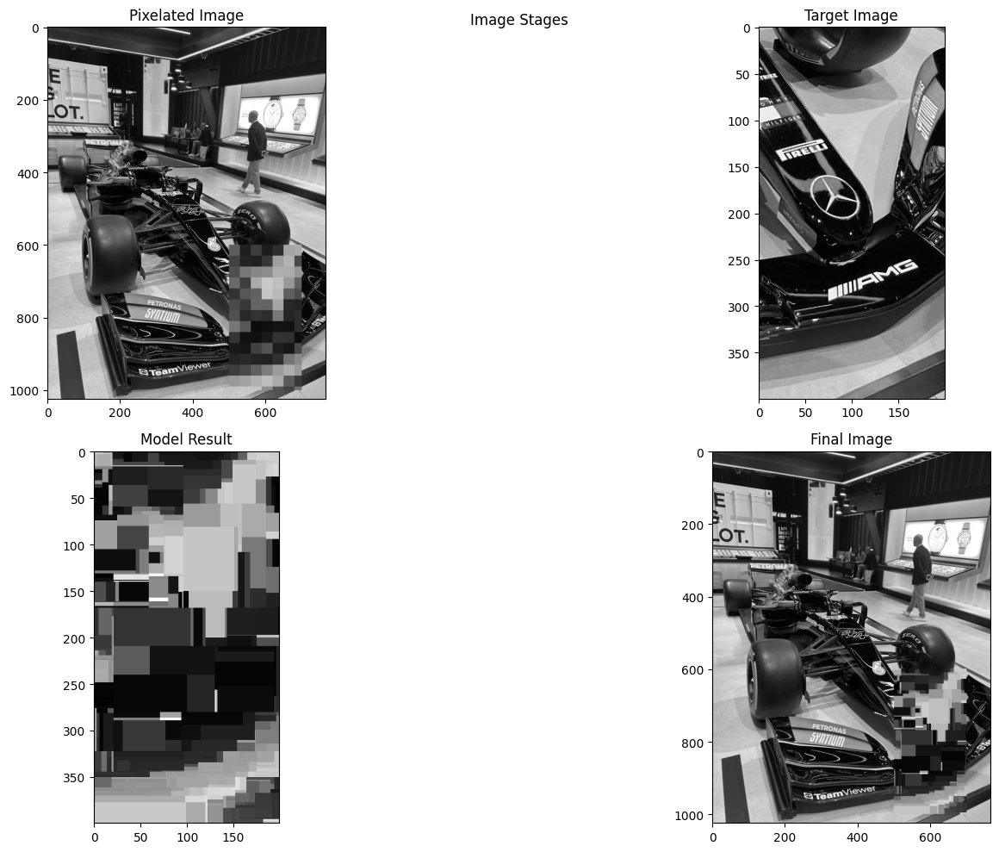


MSE value = 2303.4188


In [10]:
mseDecisionTreesDepth10 = train_model(
    regressor = DecisionTreeRegressor(max_depth=10),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseDecisionTreesDepth10,4)}")

### Decision Trees model limited by depth 20

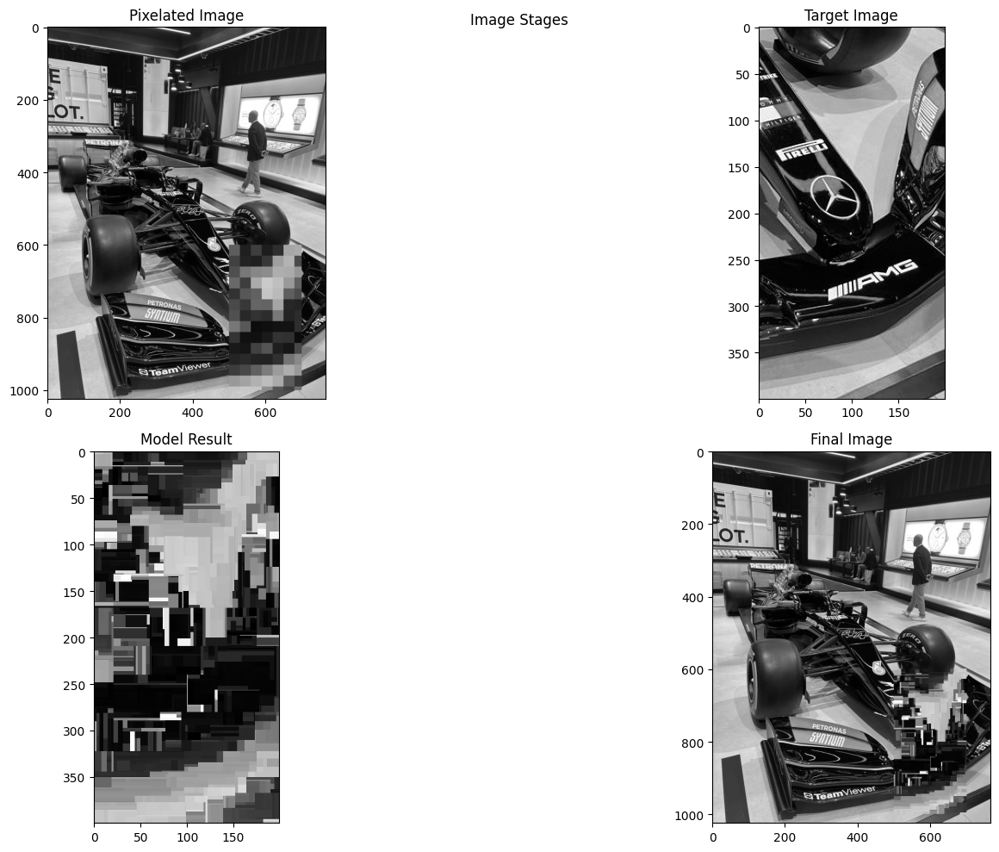


MSE value=2596.7532


In [11]:
mseDecisionTreesDepth20 = train_model(
    regressor = DecisionTreeRegressor(max_depth=20),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value={round(mseDecisionTreesDepth20,4)}")

### Decision trees model using minimal number of samples in a leaf i.e. 40

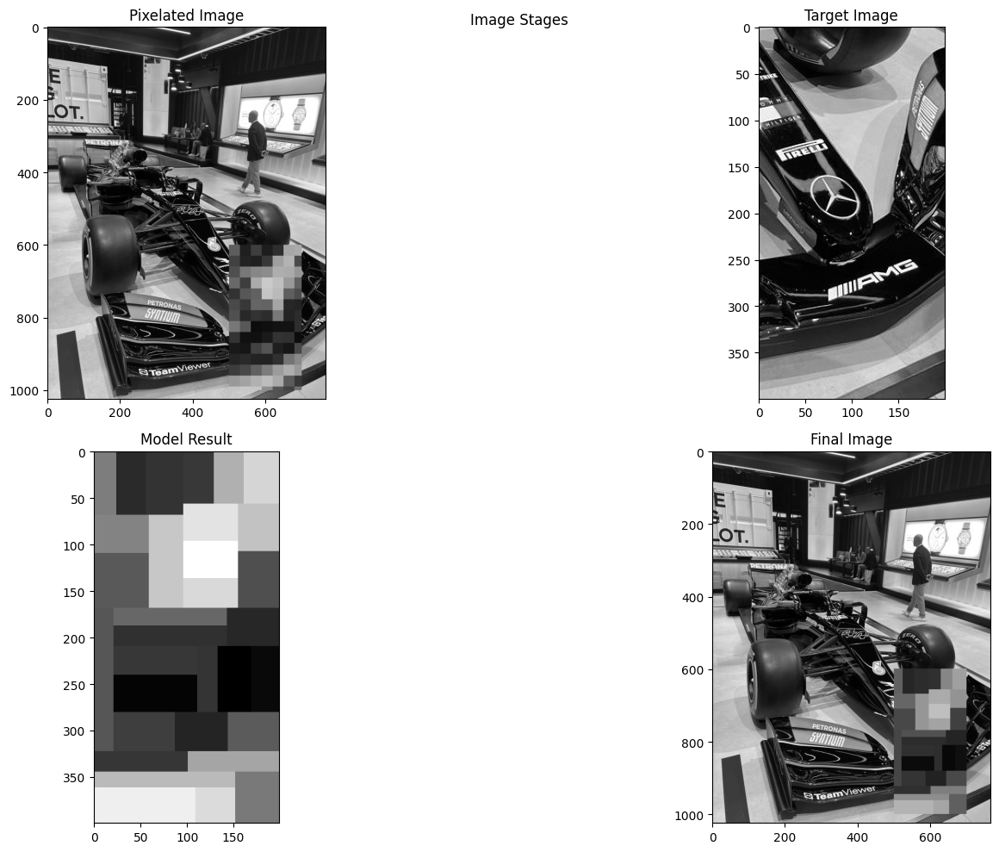


MSE value = 3281.4899


In [12]:
mseDeicionTreesLeaf40 = train_model(
    regressor = DecisionTreeRegressor(min_samples_leaf=40),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseDeicionTreesLeaf40,4)}")

### Decision trees model using minimal number of samples in a leaf i.e. 5

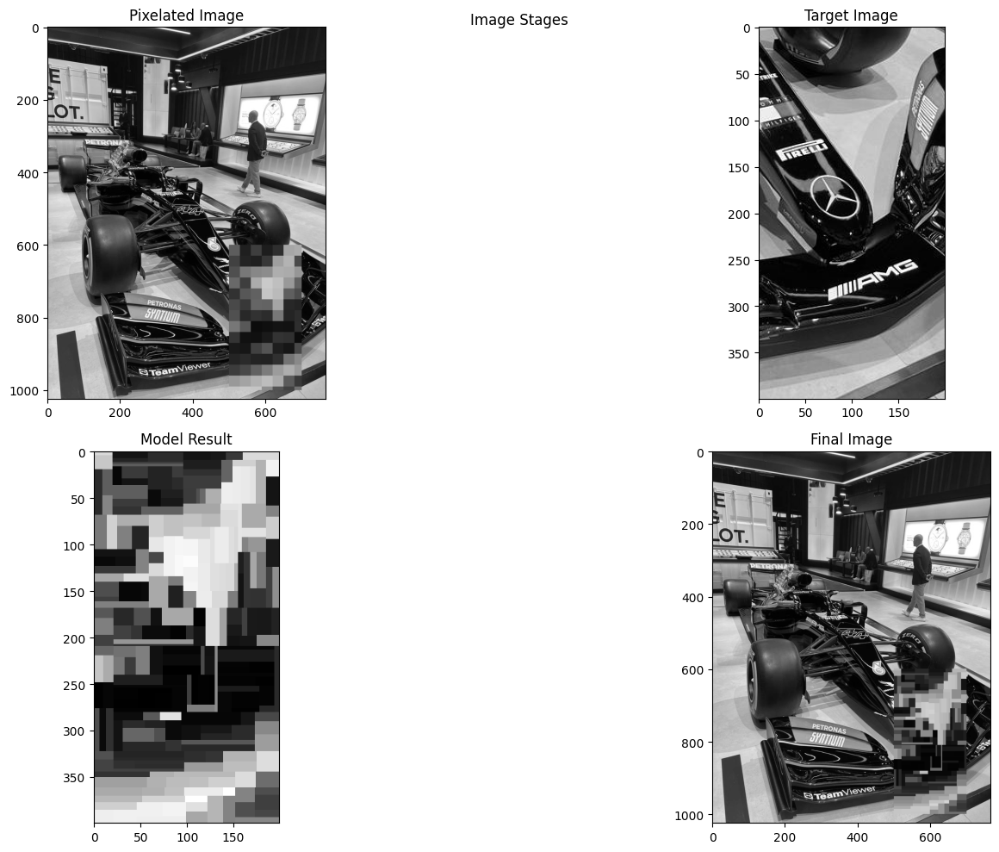


MSE value = 2435.8818


In [13]:
mseDecisionTreesLeaf5 = train_model(
    regressor = DecisionTreeRegressor(min_samples_leaf=5),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseDecisionTreesLeaf5,4)}")

### Decision trees model using minimal number of samples in a leaf i.e. 7 and max depth i.e. 40

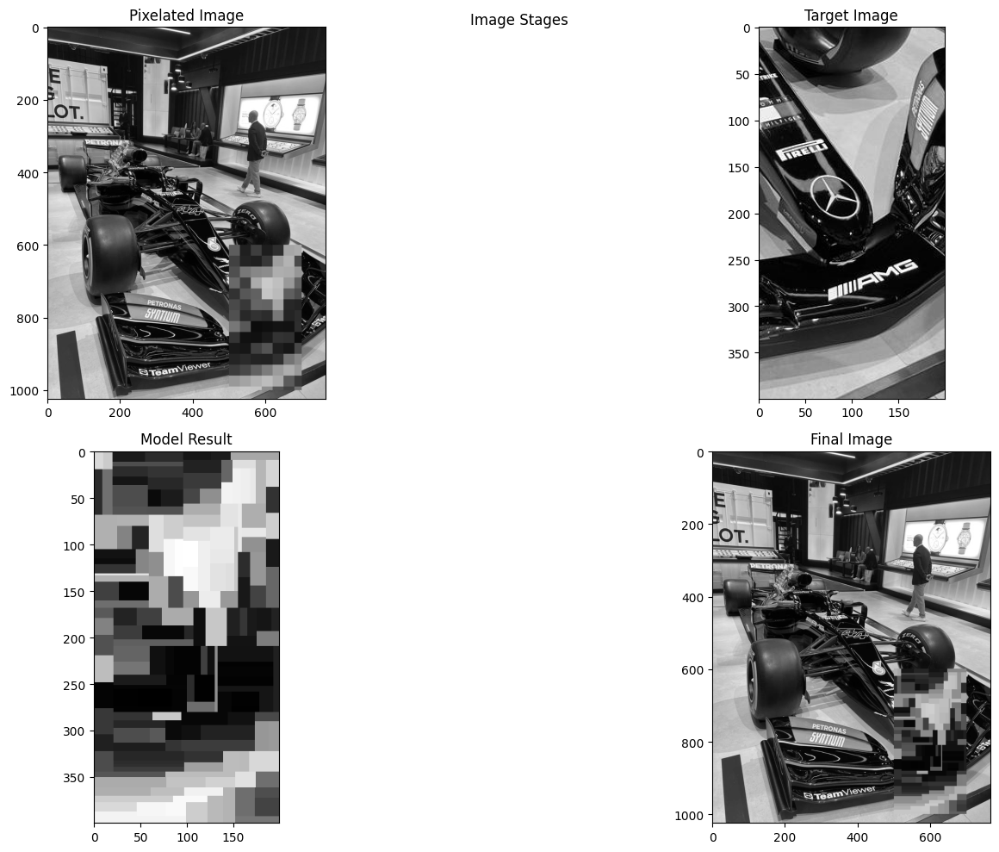


MSE value = 2462.1883


In [14]:
mseDecisionTreesDepthLeaf = train_model(
    regressor = DecisionTreeRegressor(max_depth=40,min_samples_leaf=7),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseDecisionTreesDepthLeaf,4)}")

### Random Forest model with 100 estimators

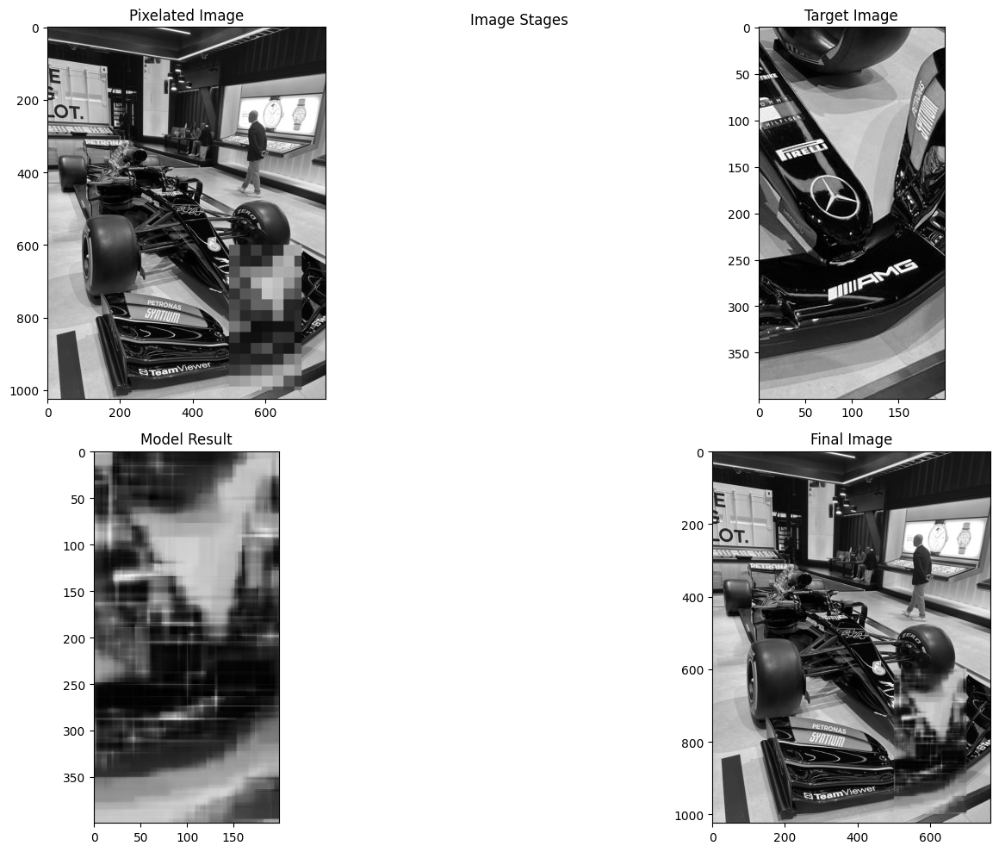


MSE value = 1648.1892


In [15]:
mseRandomForest = train_model(
    regressor = RandomForestRegressor(n_estimators=100),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseRandomForest,4)}")

### K-Nearest Neighbours model with 2 neighbours

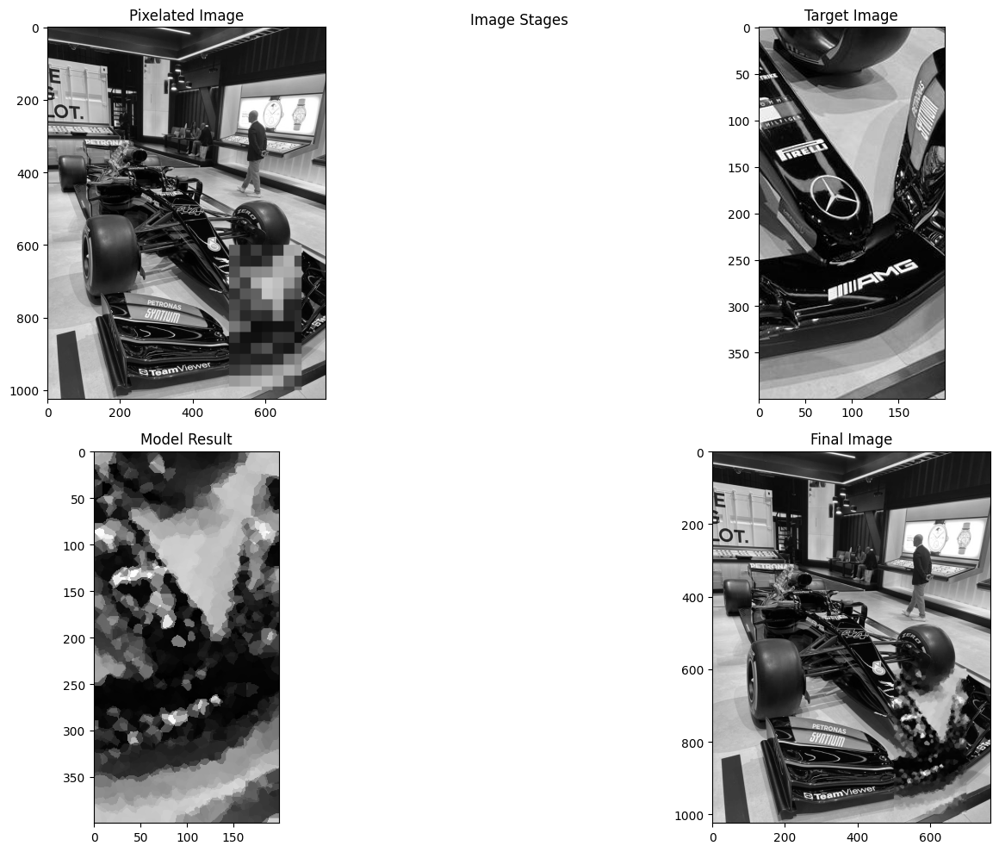


 MSE value = 1729.5443


In [16]:
mseKNN2uniform = train_model(
    regressor = KNeighborsRegressor(n_neighbors=2),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\n MSE value = {round(mseKNN2uniform,4)}")

### K-Nearest Neighbours model with 10 neighbours and weights according to distance
The predictions should be smoothened

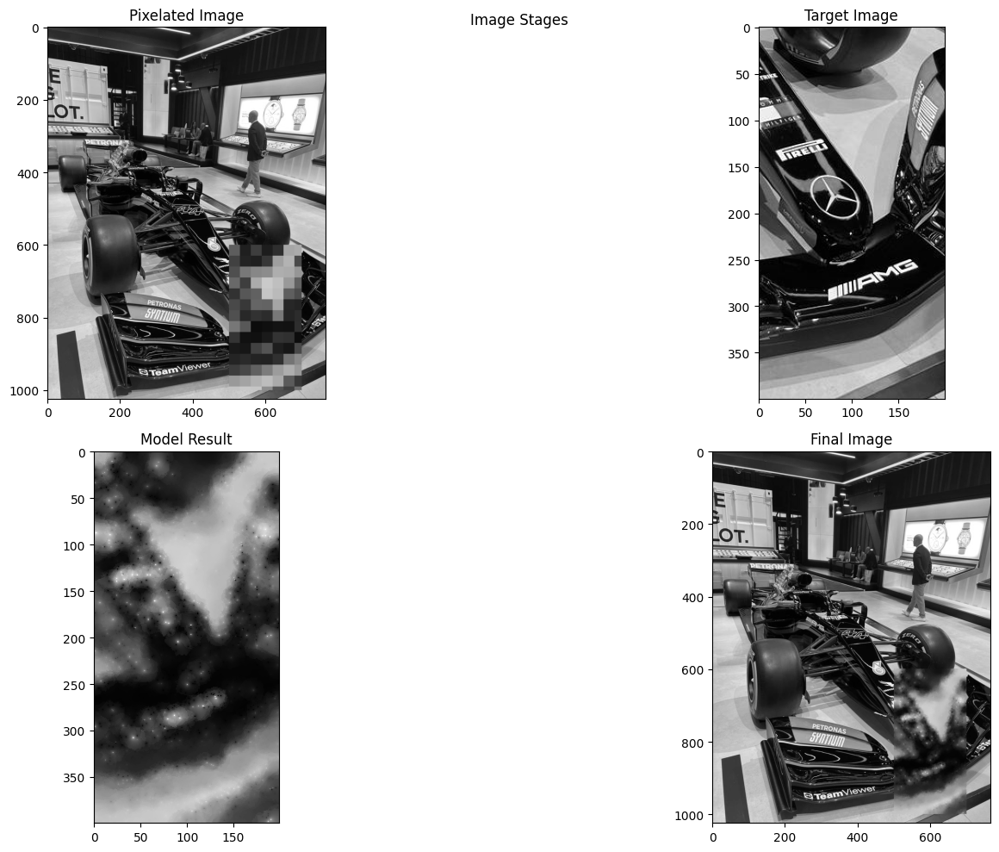


MSE value = 1552.9796


In [17]:
mseKNN5distance = train_model(
    regressor = KNeighborsRegressor(n_neighbors=10, weights='distance'),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseKNN5distance,4)}")

### K-Nearest Neighbours model with 25 neighbours and weights according to distance

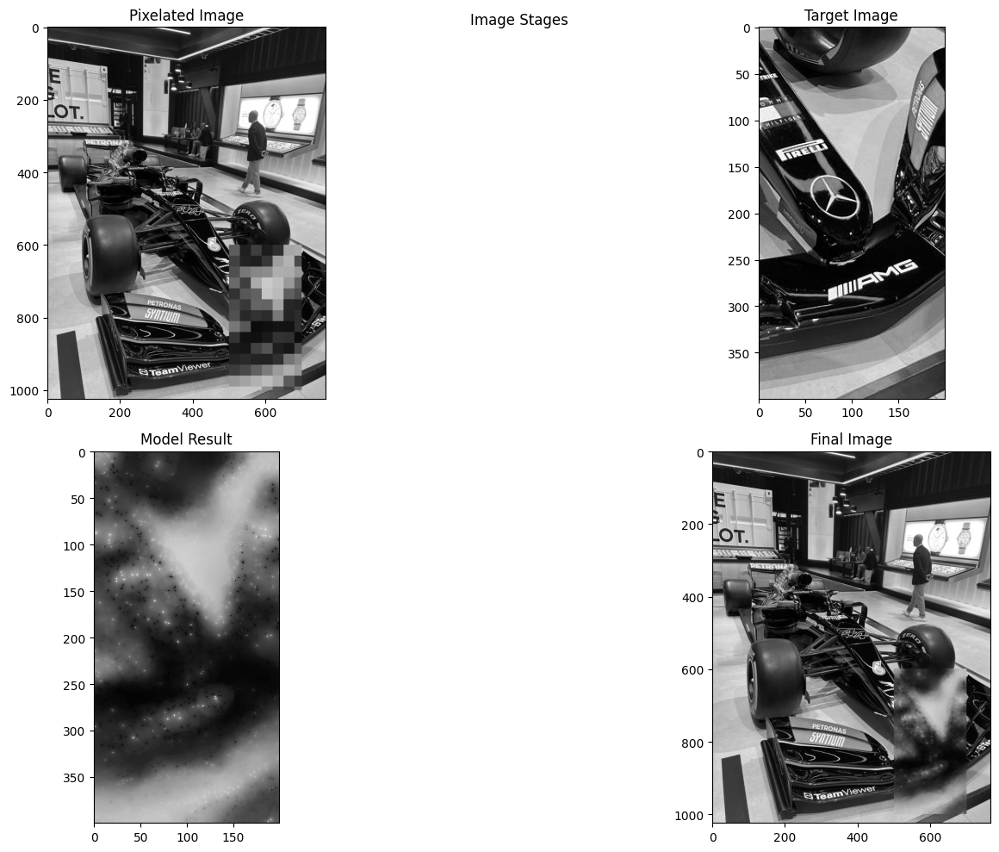


MSE value = 1828.4664


In [18]:
mseKNN25distance = train_model(
    regressor = KNeighborsRegressor(n_neighbors=25, weights='distance'),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseKNN25distance,4)}")

### K-Nearest Neighbours model with with canberra metric

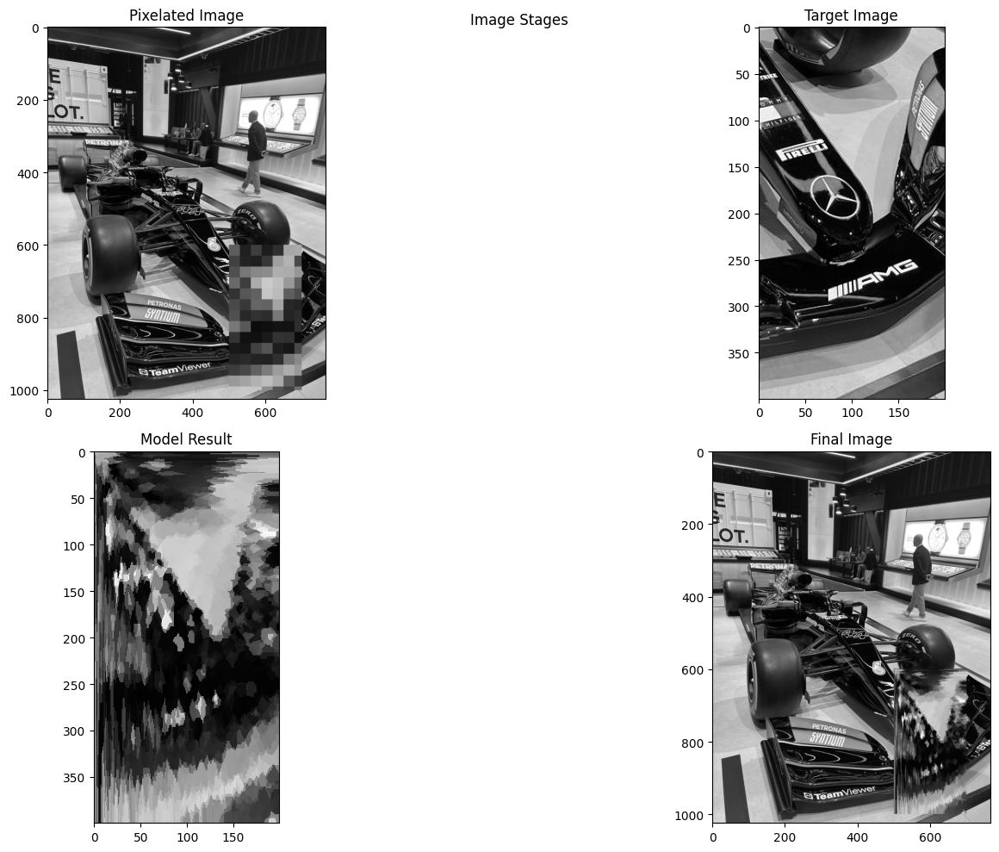


MSE value = 2293.2675


In [19]:
mseKNN2metric = train_model(
    regressor = KNeighborsRegressor(n_neighbors=2, metric='canberra'),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseKNN2metric,4)}")

### AdaBoost over Decision Trees using random projections

/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 10).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 10).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 10).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_comp

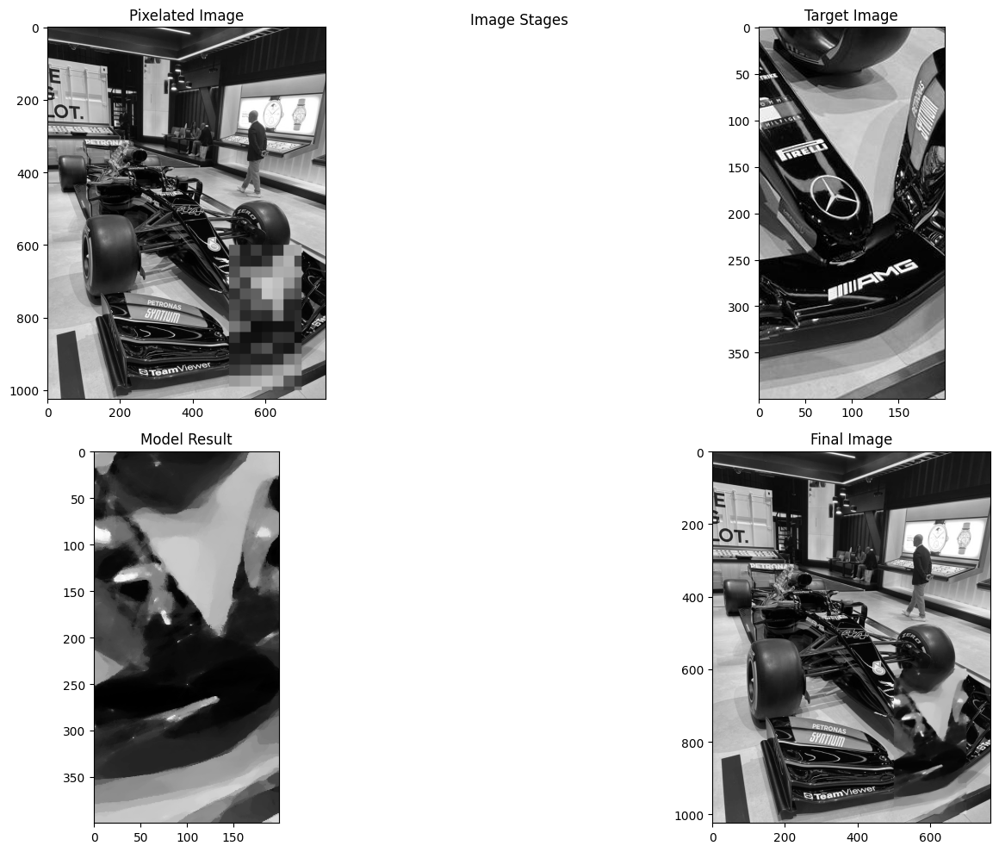


MSE value = 1475.531


In [20]:
base = make_pipeline(GaussianRandomProjection(n_components=10),
                     DecisionTreeRegressor(max_depth=10, max_features=5))
mseAdaBoost = train_model(
    regressor = AdaBoostRegressor(base, n_estimators=50, learning_rate=0.05),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseAdaBoost,4)}")

### Bagging over decision trees (sometimes referred to Random Forest) using random projections

/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 15).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 15).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_components (2 < 15).The dimensionality of the problem will not be reduced.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/random_projection.py:398: DataDimensionalityWarning: The number of components is higher than the number of features: n_features < n_comp

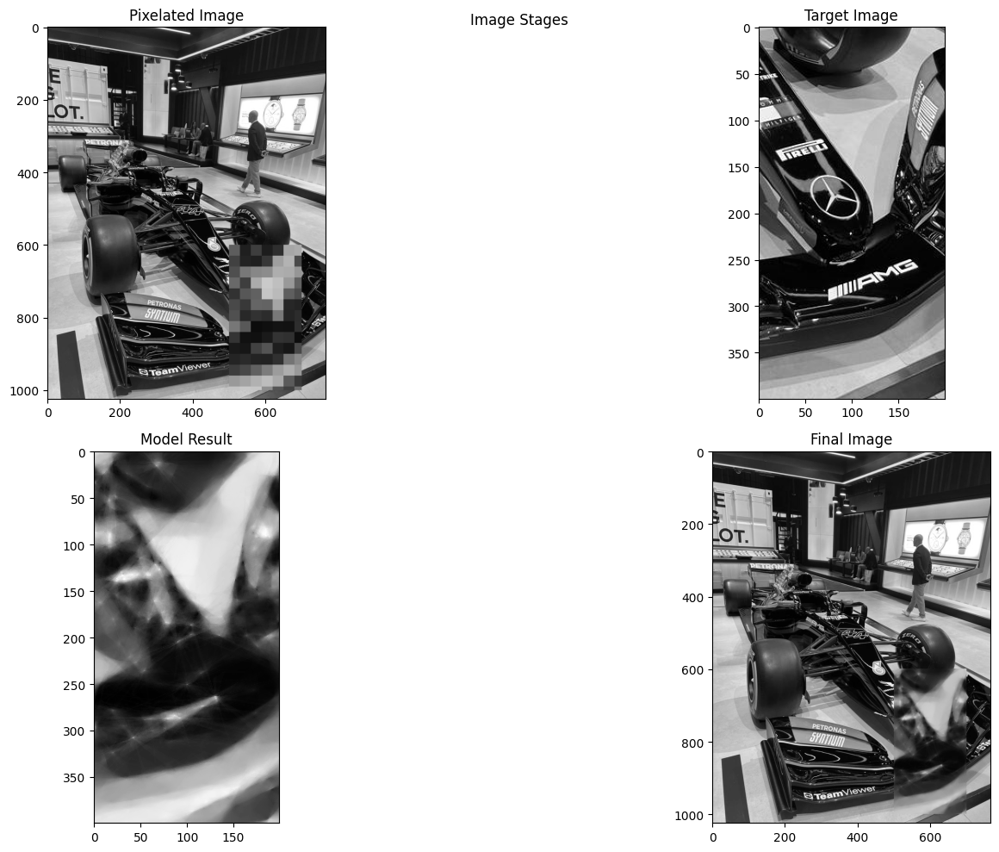


MSE value = 1428.3087


In [21]:
base = make_pipeline(GaussianRandomProjection(n_components=15),
                     DecisionTreeRegressor(max_depth=12, max_features=5))
mseBagging = train_model(
    regressor = BaggingRegressor(base, n_estimators=100),
    pixelated_image = pixelated_image,
    known_array = known_array,
    image = target_array
)
print(f"\nMSE value = {round(mseBagging,4)}")

## Plotting the MSE Losses for all the models from above

### Vertical Bar Plot

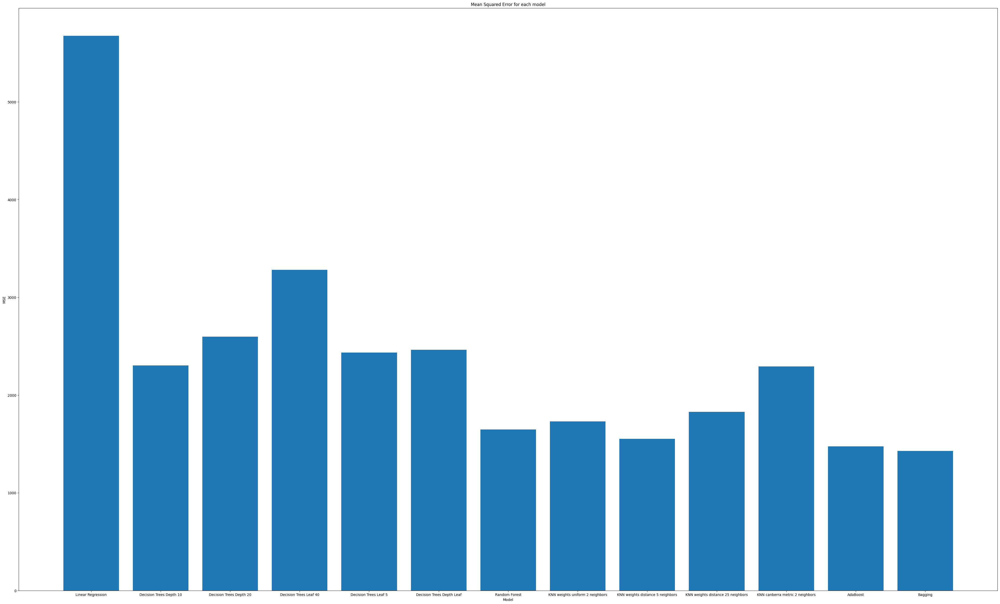

In [22]:
data = {
    "Linear Regression":mseLinearRegression,
    "Decision Trees Depth 10":mseDecisionTreesDepth10,
    "Decision Trees Depth 20":mseDecisionTreesDepth20,
    "Decision Trees Leaf 40":mseDeicionTreesLeaf40,
    "Decision Trees Leaf 5":mseDecisionTreesLeaf5,
    "Decision Trees Depth Leaf":mseDecisionTreesDepthLeaf,
    "Random Forest":mseRandomForest,
    "KNN weights uniform 2 neighbors":mseKNN2uniform,
    "KNN weights distance 5 neighbors":mseKNN5distance,
    "KNN weights distance 25 neighbors":mseKNN25distance,
    "KNN canberra metric 2 neighbors":mseKNN2metric,
    "AdaBoost":mseAdaBoost,
    "Bagging":mseBagging
}

model_names = list(data.keys())
loss_values = list(data.values())

fig = plt.figure(figsize = (50, 30))

plt.bar(model_names, loss_values)

plt.xlabel("Model")
plt.ylabel("MSE")
plt.title("Mean Squared Error for each model")
plt.show()

### Horizontal Bar Plot

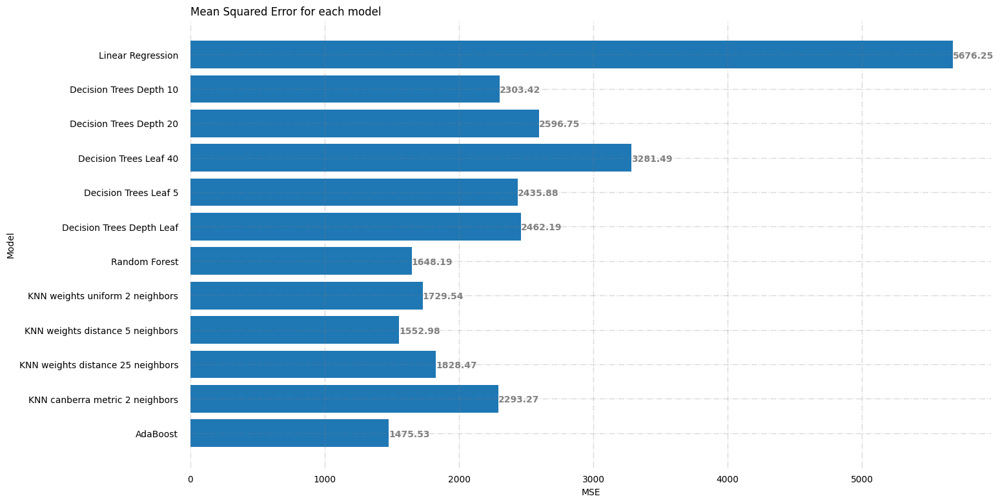

In [23]:
model = []
loss = []

for key, value in data.items():
    model.append(key)
    loss.append(value)

result = {"model": model, "loss": loss}

df = pd.DataFrame(result)

name = df['model'].head(12)
price = df['loss'].head(12)

fig, ax = plt.subplots(figsize =(16, 9))

ax.barh(name, price)

for s in ['top', 'bottom', 'left', 'right']:
	ax.spines[s].set_visible(False)

ax.xaxis.set_ticks_position('none')
ax.yaxis.set_ticks_position('none')

ax.xaxis.set_tick_params(pad = 5)
ax.yaxis.set_tick_params(pad = 10)

ax.grid(color ='grey',linestyle ='-.', linewidth = 1.0, alpha = 0.3)

ax.invert_yaxis()

for i in ax.patches:
	plt.text(i.get_width()+0.2, i.get_y()+0.5, str(round((i.get_width()), 2)),fontsize = 10, fontweight ='bold',color ='grey')

# Add Plot Title
ax.set_title('Mean Squared Error for each model',loc='left')
ax.set_xlabel("MSE")
ax.set_ylabel("Model")

plt.show()